# Performance Summmary & Conclusions

In [ ]:
# Imports

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import IPython.display as ipd

from sklearn.model_selection import train_test_split

from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import load_model
from tensorflow.math import confusion_matrix

In [ ]:
pd.set_option('display.max_colwidth', 1000)

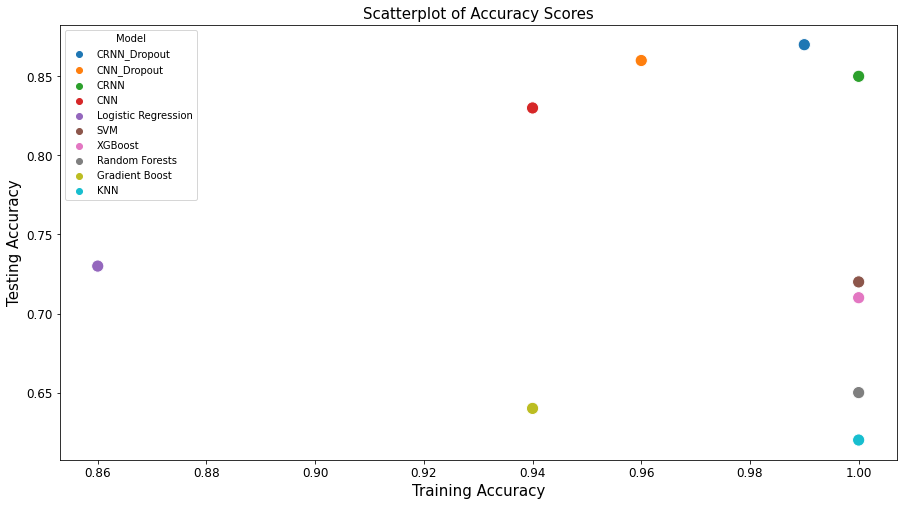

In [ ]:
accuracy_dict = {
    'Model' : ['Logistic Regression', 'KNN', 'Random Forests', 'SVM', 'Gradient Boost', 'XGBoost', 'CNN','CNN_Dropout','CRNN', 'CRNN_Dropout'],
    'Baseline' : [0.10, 0.10, 0.10, 0.10, 0.10, 0.10, 0.10, 0.10, 0.10, 0.10],
    'Training' : np.round([0.864, 0.999, 0.999, 1.0, 0.94, 1.0, 0.94, 0.96, 0.9958, 0.9860],2),
    'Testing' : np.round([0.728, 0.624, 0.652, 0.72, 0.644, 0.708, 0.8295, 0.8610, 0.8495, 0.8670],2)
}

model_results = pd.DataFrame(accuracy_dict)
model_results.set_index('Model', inplace=True)

plt.figure(figsize=(15,8))
sns.scatterplot(data=model_results.sort_values(by='Testing', ascending=False), x='Training', y='Testing', hue='Model', s=150)
plt.xlabel(xlabel='Training Accuracy', fontsize=15)
plt.ylabel(ylabel='Testing Accuracy', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Scatterplot of Accuracy Scores', fontsize=15);

Looking at the accuracy scores for all the models that I ran, it seems clear that they all seem to be suffering from high variance, some more so than others. Out of all the models, CRNN with dropout layers seems to be the optimal model with accuracy score of 99% with training data and 87% with unseen test data.

# Misclassifications

For further insight and analysis, I decided to dig a little bit deeper into the data and examine misclassifications to see if the model is predicting genres incorrectly at random or if there are certain genres that repeatedly get misclassified.

For this particular exercise, I chose to use CRNN with dropout layers as my evaluator since it ended up scoring the highest accuracy socre of 87% with unseen test data.

In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Function to save numpy array and rest of other columns seperately and then brings them together for later use

def create_df(np_path, df_path):

  loaded_np = np.load(np_path, allow_pickle=True) # Load numpy arrays
  df_exported = pd.read_csv(df_path) # Read in rest of dataframe
  df_exported['melspecs'] = loaded_np # Merge

  return df_exported

In [ ]:
np_path = '/content/gdrive/MyDrive/Music-Genre-Project/melspecs/data.npy'
df_path = '/content/gdrive/MyDrive/Music-Genre-Project/melspecs/df.csv'

In [ ]:
df = create_df(np_path, df_path)

In [ ]:
# Load CRNN_Dropout_Model

model = load_model('/content/gdrive/MyDrive/Music-Genre-Project/Models/crnn_model_dropout')

In [ ]:
# Reshaping mel-spectrograms to be suitable for CRNN
X = np.concatenate(np.array(df['melspecs'])).reshape(df['melspecs'].shape[0], 128, 130, 1)

# Standardize X
X /= 255

In [ ]:
# Run the model on the entire dataset and save predictions as a variable
preds = model.predict_classes(X)

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


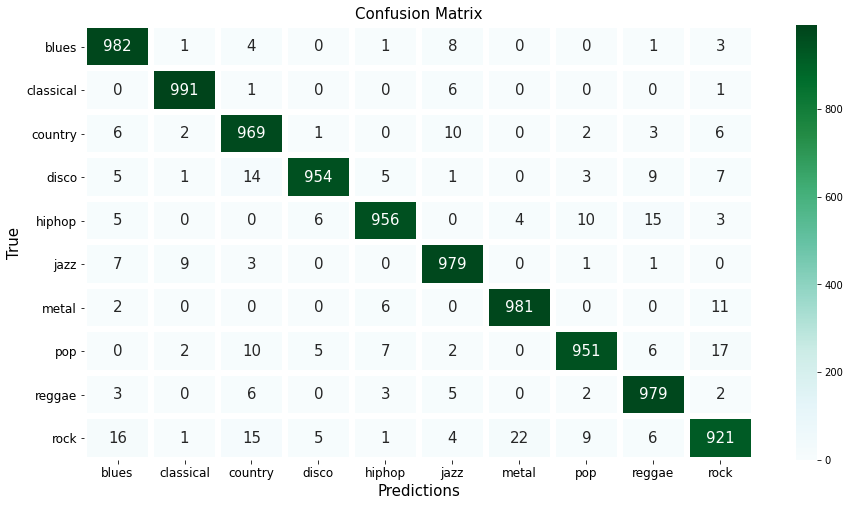

In [ ]:
# Plot confusion matrix

# Genre labels
genre_labels = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']

# Plot
plt.figure(figsize=(15,8))
sns.heatmap(confusion_matrix(df['genre_num'], preds), annot=True, cmap='BuGn', fmt='.0f', linewidths=5, annot_kws={'size' : 15}, xticklabels=genre_labels, yticklabels=genre_labels)
plt.ylabel('True', fontsize=15)
plt.xlabel('Predictions', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12, rotation=0)
plt.title('Confusion Matrix', fontsize=15);

I ran the model on the entire dataset to come up with predictions and then created a confusion matrix to spot which genres get misclassified the most often.

Classical genre had the least number of misclassifications and rock genre had the most number of misclassifications. While it wasn't too suprising to find that rock was most often getting misclassified as metal, I found some misclassifications as blues and pop to be intriguing. To further investigate, I decided to explore misclassifications under the rock genre.

In [ ]:
# New dataframe to use for misclassifications

df_eval = df.copy().drop(columns=['melspecs'])

# Misclassification Case #1: Rock or Metal?

In [ ]:
# List of samples that fall under the rock genre but classified as metal

df_eval['preds'] = preds

df_eval.loc[((df_eval['genre_num'] == 9) & (df_eval['preds']==6))].sort_values(by='file_name')

,file_name,genre,genre_num,preds
9076,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00016.wav_chunk0.wav,rock,9,6
9199,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00016.wav_chunk1.wav,rock,9,6
9054,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00016.wav_chunk2.wav,rock,9,6
9236,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00016.wav_chunk3.wav,rock,9,6
9145,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00016.wav_chunk4.wav,rock,9,6
9101,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00016.wav_chunk5.wav,rock,9,6
9119,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00016.wav_chunk6.wav,rock,9,6
9186,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00016.wav_chunk7.wav,rock,9,6
9196,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00016.wav_chunk8.wav,rock,9,6
9110,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00016.wav_chunk9.wav,rock,9,6


In [ ]:
# Example 1

rock_metal_1 = ipd.Audio('/content/gdrive/MyDrive/Music-Genre-Project/samples/rock.00016.wav')
rock_metal_1

In [ ]:
# Example 2

rock_metal_2 = ipd.Audio('/content/gdrive/MyDrive/Music-Genre-Project/samples/rock.00025.wav')
rock_metal_2

# Misclassification Case #2: Rock or Blues?

In [ ]:
# List of samples that fall under the rock genre but classified as blues

df_eval['preds'] = preds

df_eval.loc[((df_eval['genre_num'] == 9) & (df_eval['preds']==0))].sort_values(by='file_name')

,file_name,genre,genre_num,preds
9167,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00000.wav_chunk9.wav,rock,9,0
9230,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00002.wav_chunk0.wav,rock,9,0
9052,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00002.wav_chunk9.wav,rock,9,0
9113,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00003.wav_chunk6.wav,rock,9,0
9228,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00014.wav_chunk5.wav,rock,9,0
9112,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00014.wav_chunk9.wav,rock,9,0
9045,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00015.wav_chunk9.wav,rock,9,0
9409,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00018.wav_chunk8.wav,rock,9,0
9316,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00064.wav_chunk8.wav,rock,9,0
9051,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00066.wav_chunk4.wav,rock,9,0


In [ ]:
# Example 1

rock_blues_1 = ipd.Audio('/content/gdrive/MyDrive/Music-Genre-Project/samples/rock.00014.wav')
rock_blues_1

In [ ]:
# Example 2

rock_blues_2 = ipd.Audio('/content/gdrive/MyDrive/Music-Genre-Project/samples/rock.00066.wav')
rock_blues_2

# Misclassification Case #3: Rock or Pop?

In [ ]:
# List of samples that fall under the rock genre but classified as pop

df_eval['preds'] = preds

df_eval.loc[((df_eval['genre_num'] == 9) & (df_eval['preds']==7))].sort_values(by='file_name')

,file_name,genre,genre_num,preds
9730,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00050.wav_chunk0.wav,rock,9,7
9678,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00051.wav_chunk4.wav,rock,9,7
9468,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00051.wav_chunk7.wav,rock,9,7
9740,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00051.wav_chunk9.wav,rock,9,7
9793,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00052.wav_chunk1.wav,rock,9,7
9345,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00052.wav_chunk4.wav,rock,9,7
9406,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00052.wav_chunk9.wav,rock,9,7
9693,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00063.wav_chunk8.wav,rock,9,7
9644,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/rock/rock.00063.wav_chunk9.wav,rock,9,7


In [ ]:
# Example 1

rock_pop_1 = ipd.Audio('/content/gdrive/MyDrive/Music-Genre-Project/samples/rock.00051.wav')
rock_pop_1

In [ ]:
# Example 2

rock_pop_2 = ipd.Audio('/content/gdrive/MyDrive/Music-Genre-Project/samples/rock.00052.wav')
rock_pop_2

One caveat to keep in mind here is that since I had to chop up my original music audio samples into mini-samples, certain portions are predicted correctly whereas certain portions are not. To keep this exercise simple, I just loaded the full 30 second sample files since music audio samples of 3 seconds are not long enough to gauge what may be happening.

Rock genre had the most number of misclassifications. After listening to a couple of examples, I can see why the model may be misclassifying the samples above. Certain parts of the music are "uncharacteristic" and/or resemble the predicted genre much closer. This raises an important question around what exactly makes up a genre and how to deal with situations where a music/song doessn't necessarily fall under a genre very cleanly.

# Other Fun/Interesting Misclassification Examples

In [ ]:
# List of samples that fall under the jazz genre but classified as classical

df_eval['preds'] = preds

df_eval.loc[((df_eval['genre_num'] == 0) & (df_eval['preds']==1))].sort_values(by='file_name')

,file_name,genre,genre_num,preds
356,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/blues/blues.00093.wav_chunk2.wav,blues,0,1


In [ ]:
# Example 1

jazz_class_1 = ipd.Audio('/content/gdrive/MyDrive/Music-Genre-Project/samples/jazz.00000.wav')
jazz_class_1

In [ ]:
# List of samples that fall under the blues genre but misclassified as jazz

df_eval['preds'] = preds

df_eval.loc[((df_eval['genre_num'] == 0) & (df_eval['preds']==5))].sort_values(by='file_name')

,file_name,genre,genre_num,preds
543,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/blues/blues.00004.wav_chunk0.wav,blues,0,5
194,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/blues/blues.00027.wav_chunk9.wav,blues,0,5
196,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/blues/blues.00052.wav_chunk3.wav,blues,0,5
364,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/blues/blues.00069.wav_chunk0.wav,blues,0,5
752,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/blues/blues.00071.wav_chunk8.wav,blues,0,5
135,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/blues/blues.00083.wav_chunk6.wav,blues,0,5
357,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/blues/blues.00093.wav_chunk5.wav,blues,0,5
310,/content/gdrive/MyDrive/Music-Genre-Project/genres_3s_split/blues/blues.00093.wav_chunk6.wav,blues,0,5


In [ ]:
# Example 2

blues_jazz_1 = ipd.Audio('/content/gdrive/MyDrive/Music-Genre-Project/samples/blues.00093.wav')
blues_jazz_1

# Conclusions

Working with raw music audio files, I leveraged a Python module Librosa to perform my own feature extraction. Using these features which are numerical representation of the samples, I ran various traditional classifiers such as Logistic Regression, KNN, Random Forests, SVM, Gradient Boost, and XGBoost. Out of these traditional classifiers, SVM was the best performer and scored 100% accuracy with training data and 72% accuracy with unseen testing data.

To incorporate deep learning models, I extracted Mel-Spectrograms for all the audio samples. However, since 1,000 music samples were not enough to train a deep learning model, I sliced each 30 sec sample into 10 separate chunks, each 3 seconds long. Since Mel-Spectrograms are essentially images, I created a Convolutional Neural Network model (with and without regularization for comparison purposes) and fed the images through the model.

Lastly, to implement a more hybrid approah that is gaining attraction in the field of voice, speech, and music recognition, I implemented a Convolutional Recurrent Neural Network model in which convolutional layers and recurrent layers (GRU) are combined together. CRNN model was able to achieve an accuracy score as high as 86.7% with unseen test data which was very promising. 

While investigating misclassifications for further insight and exploratory analysis, I found that misclassifications took place primarily due to the fact that certain music audio samples felt more like a blend of certain genres. This seems to suggest that learning sub-genres and/or music that doesn't necessarily fall "cleanly" to a certain genre may pose a difficult challenge. However, with more data and various applications of deep learning models, I believe this is a problem that can be properly addressed.


Here are some future considerations:

1. High variance observed across all models suggests that additional effort in regularization may be appropriate.

2. GTZAN Genre Collection dataset is about 20 years old. While genres don't deviate too wildly, music is definitely something that evolves over time. It'd be interesting to test this model against some recent music samples to see if there is any impact on its performance.

3. Another important question to consider is if music genre is something that will be relevant in years to come. Latest trend seems to be that we cluster music together based on artists we like to listen to rather than specific genres. I do think from a music inventory management standpoint, genre classification can still add a lot of value by enabling companies to undertand their customers and their taste/preference in music.

4. Upon further investigation, it was clear certain songs by nature do not fall "cleanly" into a particular genre. As a solution, it may be more appropriate to classify them as clusters of genres.



